In [26]:
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
import scanpy as sc
import anndata
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sys
import seaborn as sns
from itertools import chain
#only needed  in development
import importlib # use like this: importlib.reload(typing_comparison.utils)

In [29]:
sys.path.insert(1, '/secure/projects/HTAPP_MBC/src/spatial')
from spatial_utils import *

In [30]:
sample="HTAPP-917-SMP-4531"

In [31]:
#These identifiers are set as defaults in many functions. If names are changed, this has to be adapted when calling the functions.
ct_column='cell_type'
sm_methods=["slide_seq","merfish","merfish_bin",'exseq','exseq_bin',"codex"] #spatial mathod names are hard-coded for now because some methods need special treatments. Can be fixed by giving eatch method it's own variable.
sc_method="scRNAseq"
he_method="HE_highres"
all_methods=[sc_method,*sm_methods,he_method]
all_methods

['scRNAseq',
 'slide_seq',
 'merfish',
 'merfish_bin',
 'exseq',
 'exseq_bin',
 'codex',
 'HE_highres']

In [32]:
out_dir=out_dir_base+sample
os.makedirs(out_dir, exist_ok=True)
out_dir

'/ahg/regevdata/projects/HTAPP_MBC/spatial//01_typing/HTAPP-917-SMP-4531'

## Align and prep data

In [33]:
#get the data without processing (Filter: min_genes=30 min_cells=3 but further reduce low count obs if more than 35%)
adatas=get_and_process_data(sample,data_dir,out_dir,methods=all_methods,process=False)

reading  scRNAseq  from buffer
reading  slide_seq  from buffer
reading  merfish  from buffer
reading  merfish_bin  from buffer
reading  exseq  from buffer
reading  exseq_bin  from buffer
reading  codex  from buffer
Loading processed HE_highres
Loading processed HE_highres


In [34]:
#select colors for single cell
sel_colors=colors[colors.index.isin(adatas[sc_method].obs[ct_column])]
adatas[sc_method].obs[ct_column]=pd.Categorical(adatas[sc_method].obs[ct_column], categories=sel_colors.index,ordered=True)
adatas[sc_method].uns[ct_column+"_colors"]=list(sel_colors.values)

In [35]:
#Note: the pre-applied HE scaling factor is 0.4 per default. Take this into account to align to a differently scaled HE. 

registration=pd.DataFrame(index=[i for i in list(replicate_splitter(adatas).index) if not (sc_method in i)] , 
                          columns=["crop_left","crop_right","crop_top","crop_bottom","scale","shift_x","shift_y","degrees"])
#HE 1
registration.loc["HE 1","crop_left"]=-190#50
registration.loc["HE 1","crop_right"]=0
registration.loc["HE 1","crop_top"]=0
registration.loc["HE 1","crop_bottom"]=-350#150
registration.loc["HE 1","scale"]=0.6905#0.75
registration.loc["HE 1","degrees"]=94#94.5

#HE 2
registration.loc["HE 2","crop_left"]=600
registration.loc["HE 2","crop_right"]=0
registration.loc["HE 2","crop_top"]=0
registration.loc["HE 2","crop_bottom"]=0
registration.loc["HE 2","scale"]=0.6905#0.68
registration.loc["HE 2","degrees"]=87

#Annotation HE 1
registration.loc["HE 1 annot","crop_left"]=registration.loc["HE 1","crop_left"]-50
registration.loc["HE 1 annot","crop_right"]=0
registration.loc["HE 1 annot","crop_top"]=0
registration.loc["HE 1 annot","crop_bottom"]=registration.loc["HE 1","crop_bottom"]-150
registration.loc["HE 1 annot","scale"]=registration.loc["HE 1","scale"]/0.75
registration.loc["HE 1 annot","degrees"]=-0.5


#Annotation HE 2
registration.loc["HE 2 annot","crop_left"]=0
registration.loc["HE 2 annot","crop_right"]=0
registration.loc["HE 2 annot","crop_top"]=0
registration.loc["HE 2 annot","crop_bottom"]=0
registration.loc["HE 2 annot","scale"]=registration.loc["HE 2","scale"]/0.68
registration.loc["HE 2 annot","degrees"]=0

#slide_seq 1
registration.loc["slide_seq 1","shift_x"]=500
registration.loc["slide_seq 1","shift_y"]=-100
registration.loc["slide_seq 1","degrees"]=90

#slide_seq 2
registration.loc["slide_seq 2","shift_x"]=450
registration.loc["slide_seq 2","shift_y"]=4200
registration.loc["slide_seq 2","degrees"]=125

#merfish 2
registration.loc["merfish 2","shift_x"]=620
registration.loc["merfish 2","shift_y"]=-1000
registration.loc["merfish 2","degrees"]=179

#merfish_bin 2
registration.loc["merfish_bin 2","shift_x"]=560
registration.loc["merfish_bin 2","shift_y"]=-1150
registration.loc["merfish_bin 2","degrees"]=179

#exseq 2
registration.loc["exseq 2","shift_x"]=600
registration.loc["exseq 2","shift_y"]=4600
registration.loc["exseq 2","degrees"]=90

#exseq_bin 2
registration.loc["exseq_bin 2","shift_x"]=600
registration.loc["exseq_bin 2","shift_y"]=4600
registration.loc["exseq_bin 2","degrees"]=90

#codex 2
registration.loc["codex 2","shift_x"]=(560,100)
registration.loc["codex 2","shift_y"]=(3050,-3225)
registration.loc["codex 2","degrees"]=(177,176)


reg_file=out_dir+"/"+sample+"_registration.csv"
if os.path.isfile(reg_file)&False:
    print("Reading registation.")
    registration=pd.read_csv(reg_file,index_col=0)
else:
    print("Writing registration.")
    registration.to_csv(reg_file)

Writing registration.


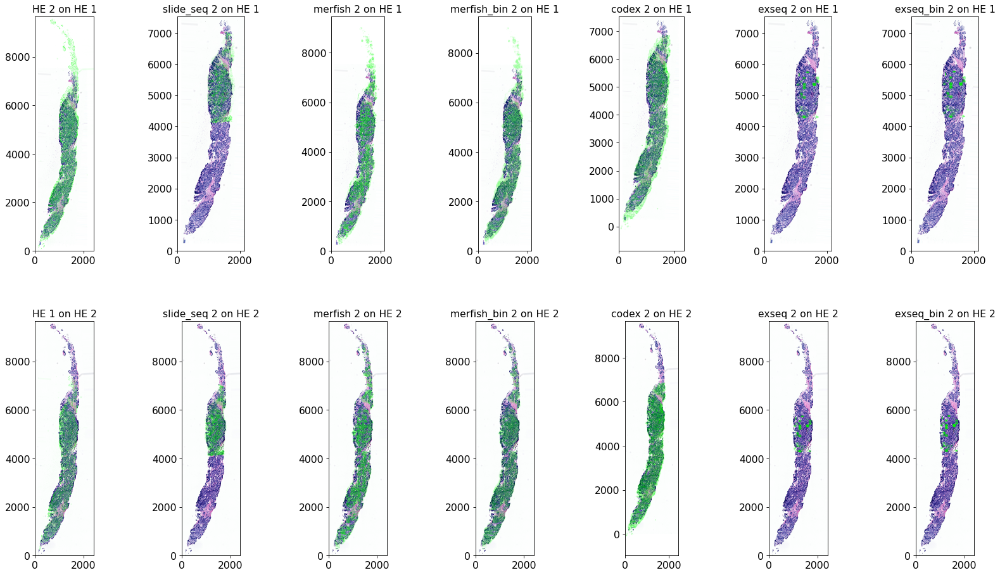

In [40]:
aligner(adatas,img_idx="HE 1",img_idx2="HE 2",dat_idxs=["slide_seq 2","merfish 2","merfish_bin 2","codex 2","exseq 2","exseq_bin 2"],registration=registration,dot_sizes=[0.1,0.05,0.001,0.1,1,0.1],figsize=(26,14),adjust=False,change=True)

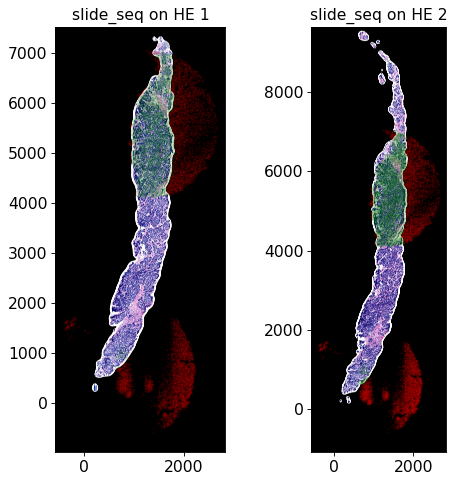

In [12]:
create_mask(adatas, ["HE 1","HE 2"],dat_idxs=["slide_seq"],figsize=(7,7),dot_sizes=[0.05],s=40,t=0.9)

In [41]:
add_annotations(adatas,sample,dat_idxs=["slide_seq","merfish","merfish_bin","codex","exseq","exseq_bin"],registration=registration)

Fibrosis
ImmuneCells
Unidentifiable
Tumor
Tumor
Fibrosis
ImmuneCells
Unidentifiable


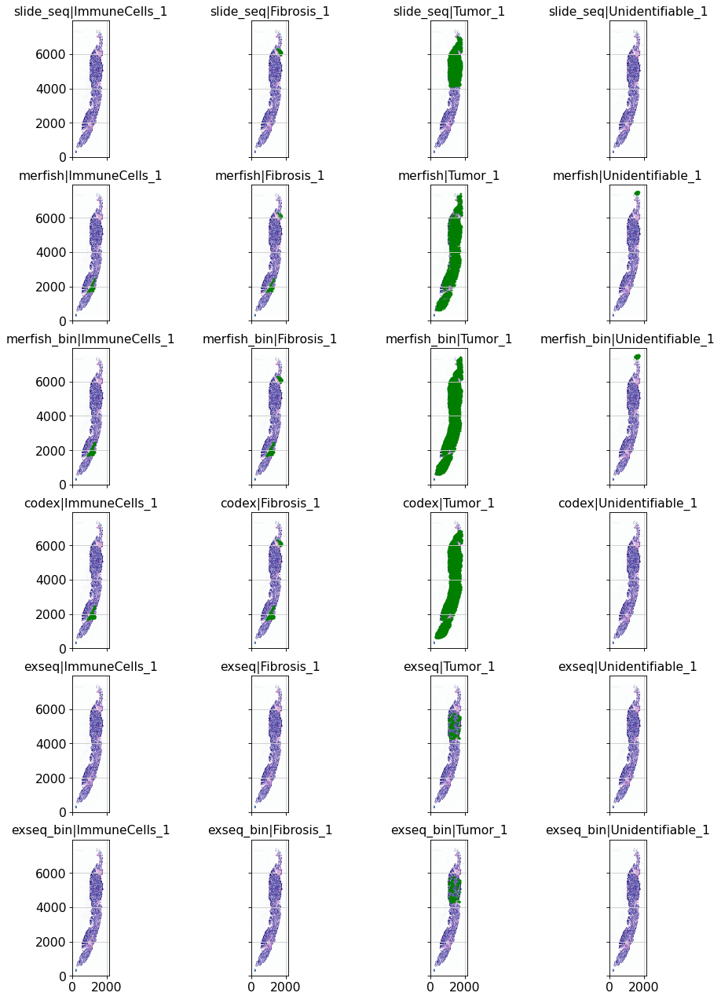

In [42]:
plot_annnotation(adatas,dat_idxs=["slide_seq","merfish","merfish_bin","codex","exseq","exseq_bin"],annots=["ImmuneCells_1","Fibrosis_1","Tumor_1","Unidentifiable_1"],HE="HE 1",figsize=[14,20],s=0.05)

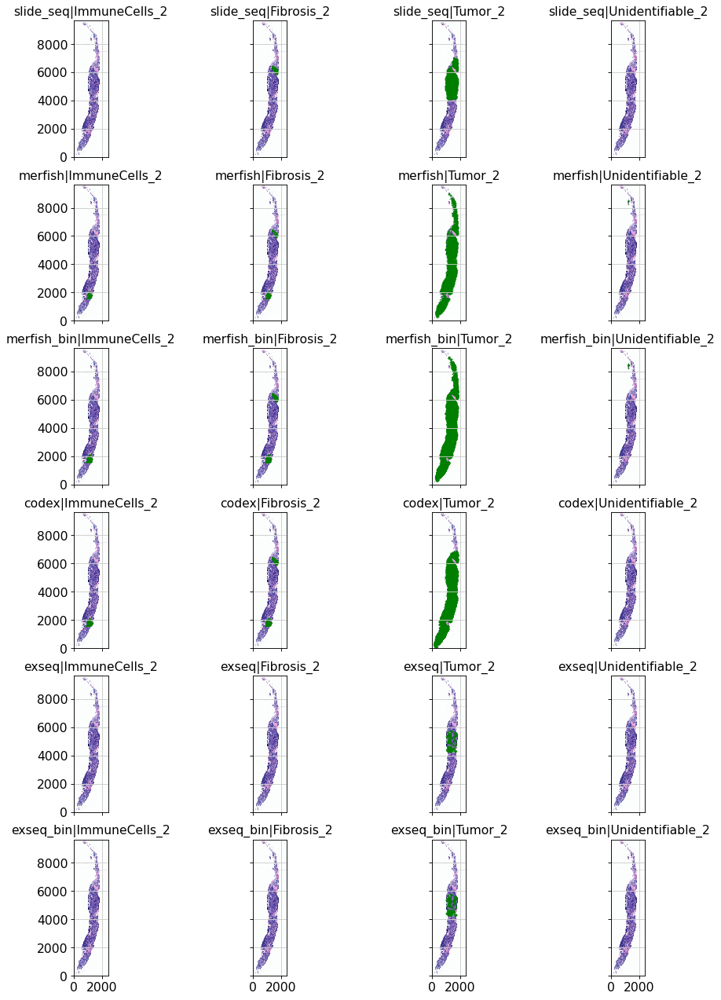

In [43]:
plot_annnotation(adatas,dat_idxs=["slide_seq","merfish","merfish_bin","codex","exseq","exseq_bin"],annots=["ImmuneCells_2","Fibrosis_2","Tumor_2","Unidentifiable_2"],HE="HE 2",figsize=[14,20],s=0.05)

In [16]:
adatas=update_processed_adatas(adatas,sample,out_dir,all_methods,overwrite=True,process=True,exclude=("slide_seq",1))

Processing scRNAseq
No HE masks found. Not trimming data.


Trying to set attribute `.obs` of view, copying.


Processing slide_seq
Processing merfish
No HE masks found. Not trimming data.
Processing merfish_bin
No HE masks found. Not trimming data.
Processing codex
No HE masks found. Not trimming data.
Normalization turned off.


In [44]:
adatas=update_processed_adatas(adatas,sample,out_dir,["exseq","exseq_bin"],overwrite=True,process=True)

Processing exseq
No HE masks found. Not trimming data.
Processing exseq_bin
No HE masks found. Not trimming data.


## Load the processed data

In [95]:
adatas=get_and_process_data(sample,data_dir,out_dir,methods=all_methods)

reading  scRNAseq  from buffer
reading  slide_seq  from buffer
reading  merfish  from buffer
reading  merfish_bin  from buffer
reading  codex  from buffer
Loading processed HE_highres
Loading processed HE_highres


## Look at the data

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


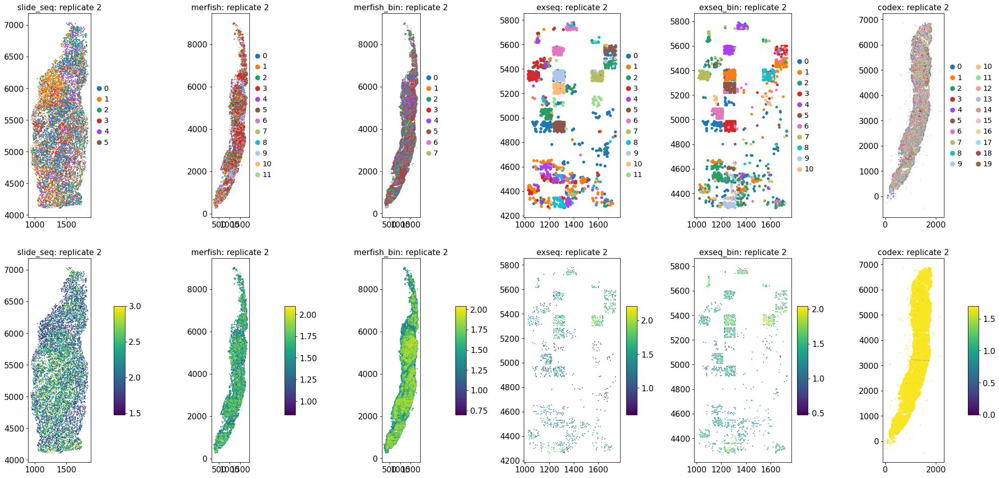

In [56]:
plot_spatial_obs(adatas,sm_methods,axsize=(4,5),x_shifts=[0,-0.025],wspace=-0.01)

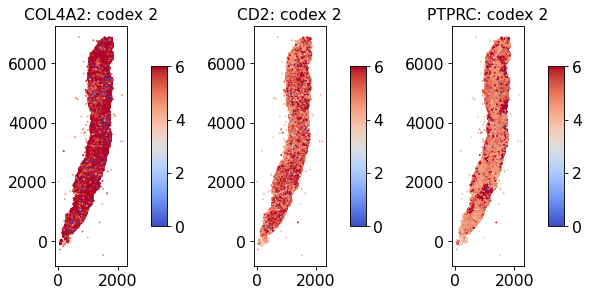

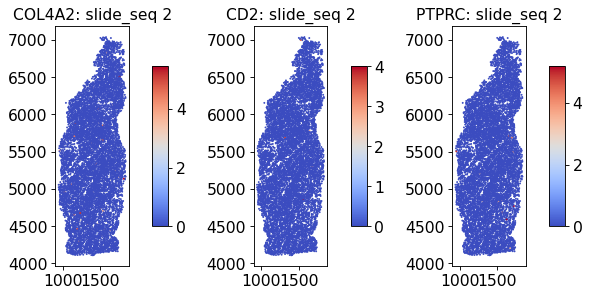

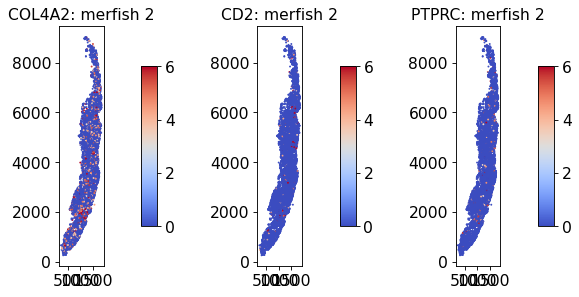

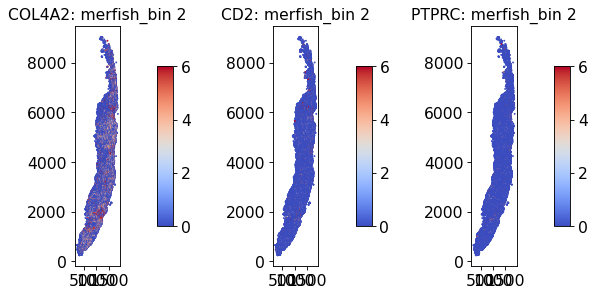

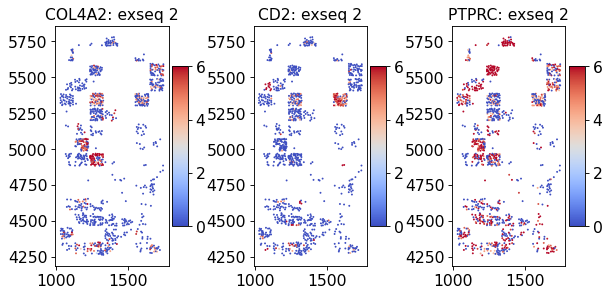

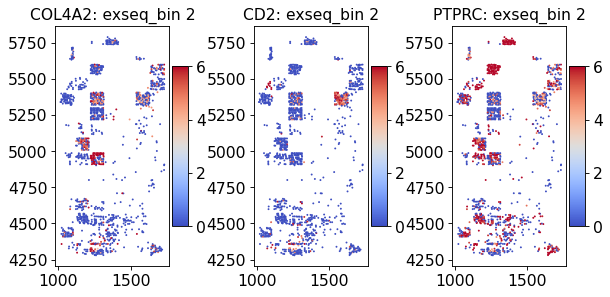

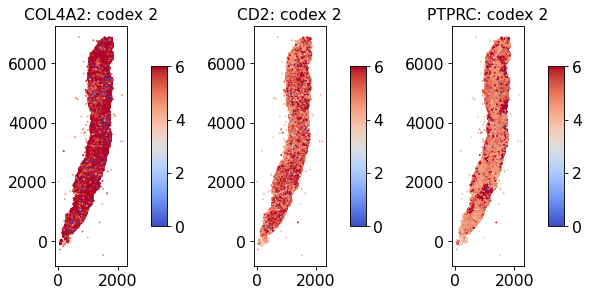

In [59]:
plot_spatial_genes(adatas,methods=sm_methods,genes = ["COL4A2","CD2","PTPRC"],axsize=(3,3),wspace=-0.12)

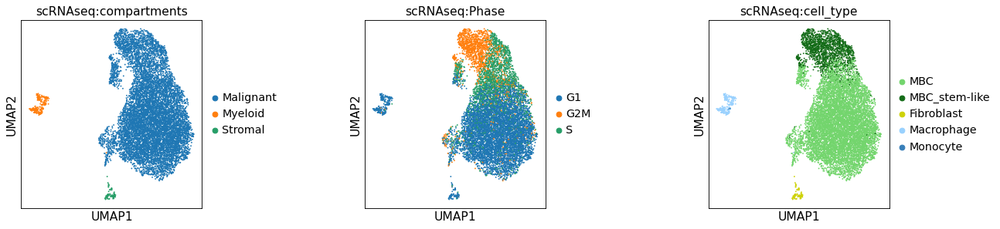

In [65]:
plot_variable_individual(adatas,method_vars=[("scRNAseq","compartments"),("scRNAseq","Phase"),("scRNAseq","cell_type")])

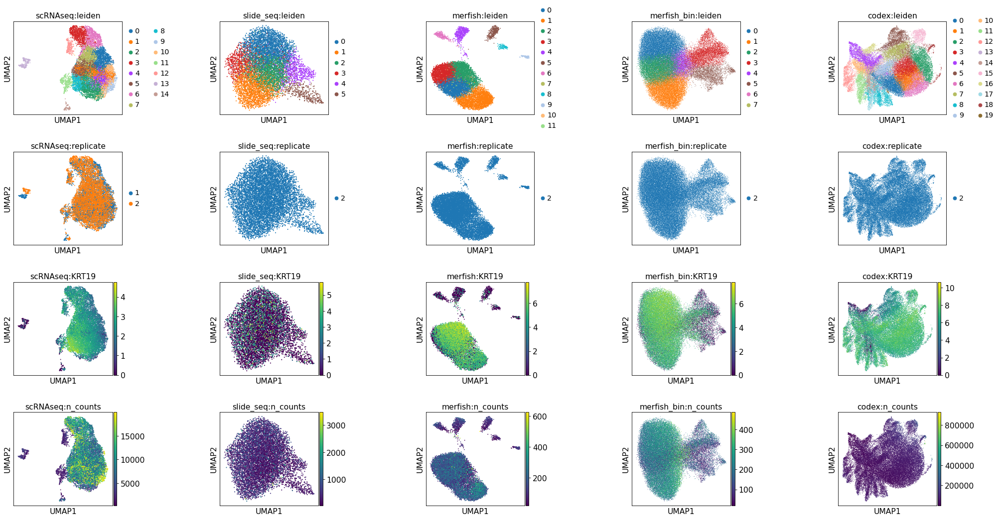

In [64]:
plot_variable_grid(adatas,methods=[sc_method,"slide_seq","merfish","merfish_bin","codex"],variables=['leiden','replicate','KRT19','n_counts'])

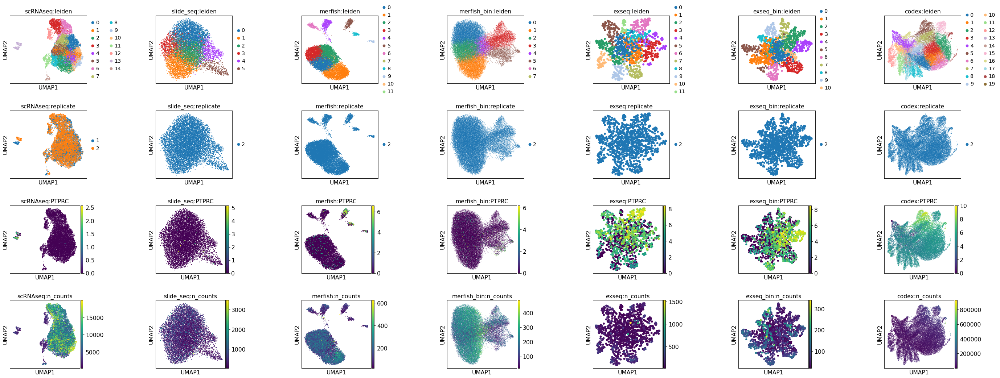

In [63]:
plot_variable_grid(adatas,methods=[sc_method,*sm_methods],variables=['leiden','replicate','PTPRC','n_counts'])

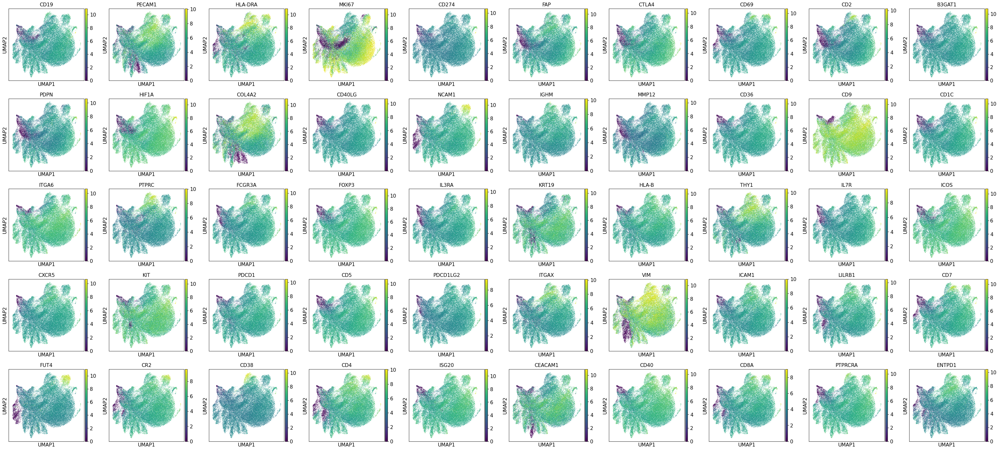

In [103]:
sc.pl.umap(adatas['codex'],color=adatas['codex'].var.index,ncols=10)

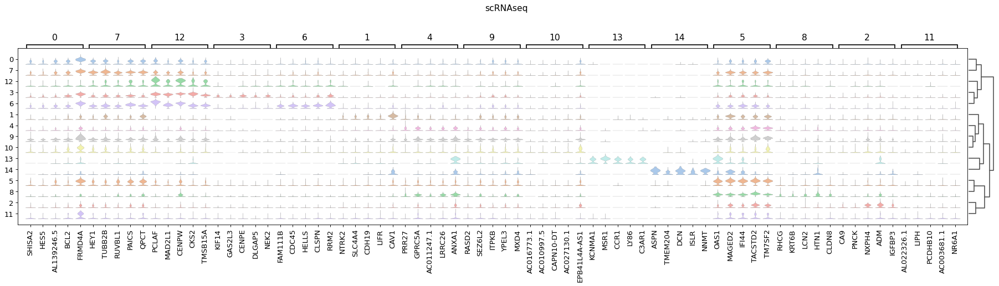

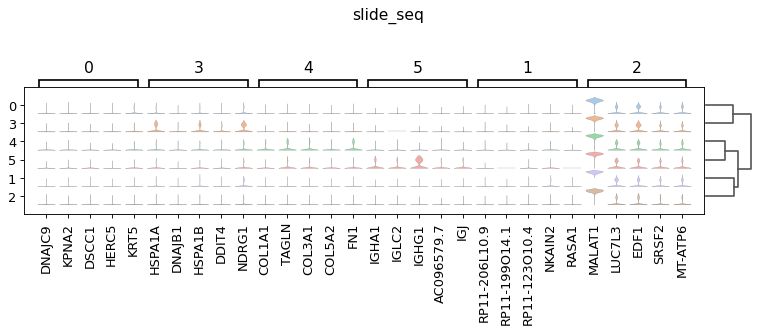

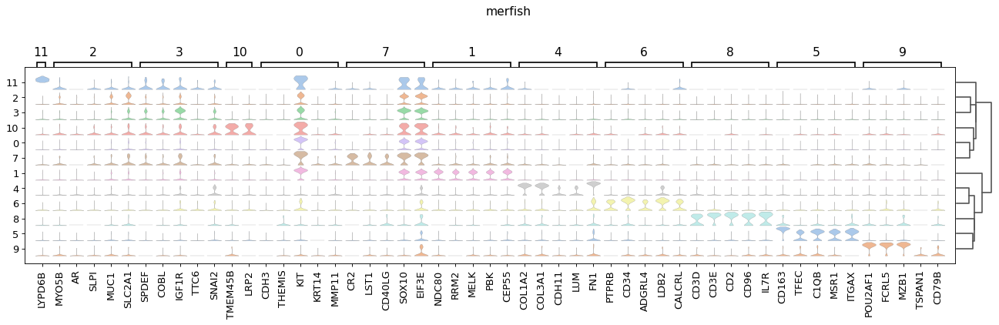

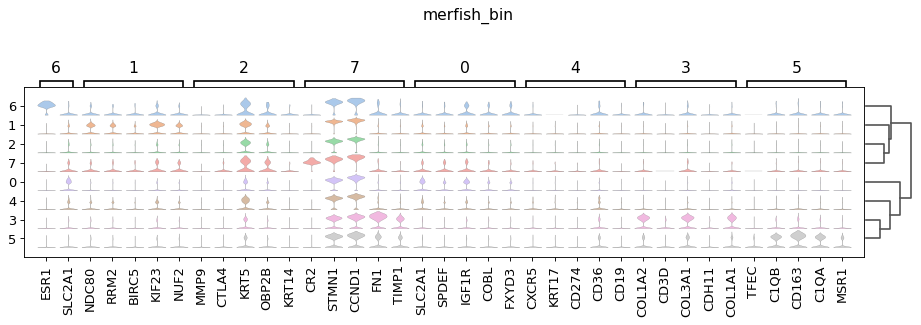

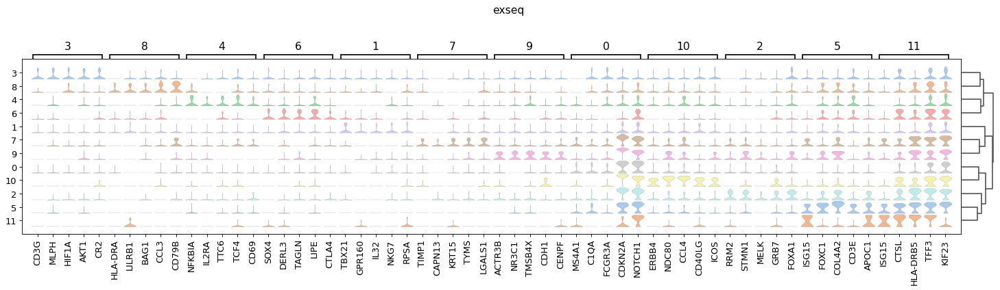

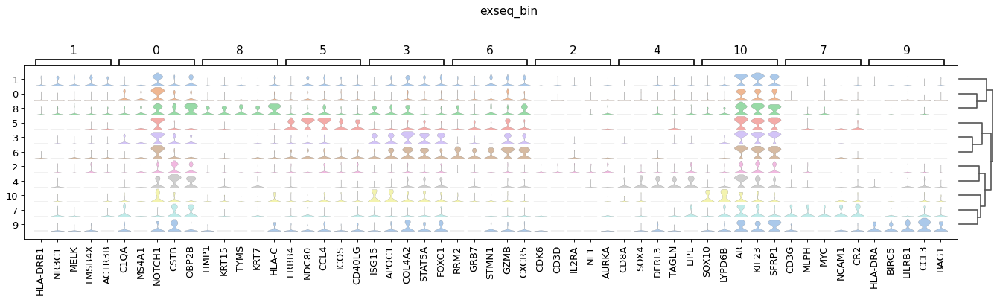

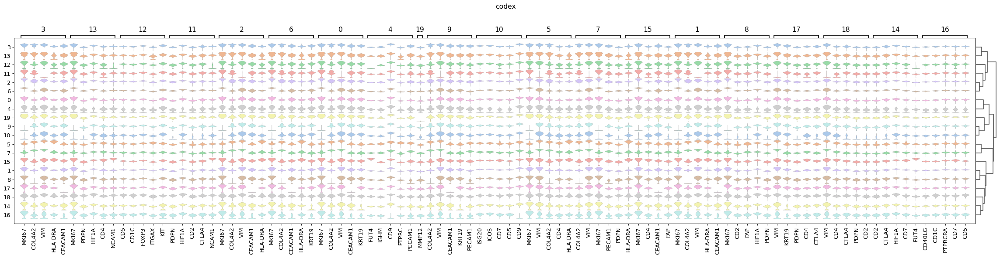

In [66]:
get_sub_markers(adatas,methods=[sc_method,*sm_methods],rest_thres=1)